In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Import & Clean Data:

In [2]:
df1 = pd.read_csv('hourly_90-94.csv')
df2 = pd.read_csv('hourly_95-99.csv')
df3 = pd.read_csv('hourly_00-04.csv')
df4 = pd.read_csv('hourly_05-09.csv')
df5 = pd.read_csv('hourly_10-14.csv')
df6 = pd.read_csv('hourly_15-19.csv')
df7 = pd.read_csv('hourly_20-23.csv')

In [10]:
df = pd.concat([df1, df2, df3, df4, df5, df6, df7], ignore_index=True)
SO2 = df[df['POLLUTANT'] == 'Sulphur Dioxide']
CO = df[df['POLLUTANT'] == 'Carbon Monoxide']
PM25 = df[df['POLLUTANT'] == 'Fine Suspended Particulates ']       # does not exist in the data
NO2 = df[df['POLLUTANT'] == 'Nitrogen Dioxide']
NOX = df[df['POLLUTANT'] == 'Nitrogen Oxides']
O3 = df[df['POLLUTANT'] == 'Ozone']
PM10 = df[df['POLLUTANT'] == 'Respirable Suspended Particulates']

In [12]:
''' ONLY RUN THIS CELL ONCE TO CREATE THE CSV FILES & STATIONS LIST '''
# SO2.to_csv('SO2.csv', index=False)
# CO.to_csv('CO.csv', index=False)
# NO2.to_csv('NO2.csv', index=False)
# NOX.to_csv('NOX.csv', index=False)
# O3.to_csv('O3.csv', index=False)
# PM10.to_csv('PM10.csv', index=False)
# PM25.to_csv('PM25.csv', index=False)
# Stations = SO2.columns[3:]

In [15]:
''' FUNCTION TO CLEAN THE DATA '''
def clean(df, Stations):
    df['DATE'] = pd.to_datetime(df['DATE'])
    # df['HOUR'] = pd.to_datetime(df['HOUR'], format='%H').dt.time
    df = df.sort_values(by='DATE')
    df = df.replace('N.A.', np.nan)
    df = df.replace('NoData', np.nan)
    df[Stations] = df[Stations].astype(float)
    df['Average'] = df[Stations].mean(axis=1)
    df['Average'] = df['Average'].astype(float)
    return df

C:\Users\ahirs\AppData\Local\Temp\ipykernel_6576\3190945868.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['DATE'] = pd.to_datetime(df['DATE'])


,DATE,HOUR,POLLUTANT,SHATIN,TSUEN WAN,CENTRAL,EASTERN,KWUN TONG,TUEN MUN,TUNG CHUNG,...,YUEN LONG,CENTRAL/WESTERN,NORTH,KWAI CHUNG,TAP MUN,TSEUNG KWAN O,TAI PO,MONG KOK,CAUSEWAY BAY,Average
43824,1993-01-01,1,Respirable Suspended Particulates,56.0,37.0,NaN,NaN,59.0,NaN,NaN,...,NaN,64.0,NaN,37.0,NaN,NaN,NaN,NaN,NaN,50.600000
43847,1993-01-01,24,Respirable Suspended Particulates,58.0,60.0,NaN,NaN,91.0,NaN,NaN,...,NaN,83.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.000000
43846,1993-01-01,23,Respirable Suspended Particulates,60.0,50.0,NaN,NaN,77.0,NaN,NaN,...,NaN,88.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68.750000
43845,1993-01-01,22,Respirable Suspended Particulates,58.0,41.0,NaN,NaN,55.0,NaN,NaN,...,NaN,75.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.250000
43844,1993-01-01,21,Respirable Suspended Particulates,60.0,42.0,NaN,NaN,52.0,NaN,NaN,...,NaN,65.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1792849,2023-12-11,2,Respirable Suspended Particulates,22.0,22.0,28.0,26.0,25.0,19.0,20.0,...,23.0,18.0,28.0,24.0,30.0,29.0,24.0,26.0,28.0,24.388889
1792848,2023-12-11,1,Respirable Suspended Particulates,22.0,23.0,27.0,22.0,23.0,20.0,20.0,...,24.0,15.0,21.0,25.0,25.0,26.0,25.0,26.0,29.0,23.277778
1792871,2023-12-11,24,Respirable Suspended Particulates,10.0,11.0,23.0,10.0,10.0,18.0,11.0,...,14.0,6.0,NaN,12.0,11.0,18.0,13.0,12.0,20.0,13.294118
1792858,2023-12-11,11,Respirable Suspended Particulates,6.0,5.0,17.0,5.0,7.0,10.0,4.0,...,8.0,NaN,15.0,7.0,6.0,5.0,NaN,6.0,18.0,8.187500


In [25]:
''' CLEANING THE DATA '''
SO2 = clean(SO2, Stations)
CO = clean(CO, Stations)
NO2 = clean(NO2, Stations)
NOX = clean(NOX, Stations)
O3 = clean(O3, Stations)
PM10 = clean(PM10, Stations)
PM25 = clean(PM25, Stations)

c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '13/04/1991' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '14/04/1991' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '15/04/1991' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  cache_array = _maybe_cache(arg, format, cache, convert_listlike)
c:\Users\ahirs\anaconda3\lib\site-packages\pandas\core\tools\datetimes.py:1047: UserWarning: Parsing '16/04/1991' in DD/MM/YYYY format. Provide format or specif

In [26]:
SO2.to_csv('SO2.csv', index=False)
CO.to_csv('CO.csv', index=False)
NO2.to_csv('NO2.csv', index=False)
NOX.to_csv('NOX.csv', index=False)
O3.to_csv('O3.csv', index=False)
PM10.to_csv('PM10.csv', index=False)
PM25.to_csv('PM25.csv', index=False)

... rest of the real code ...

Testing area(not part of the final code):

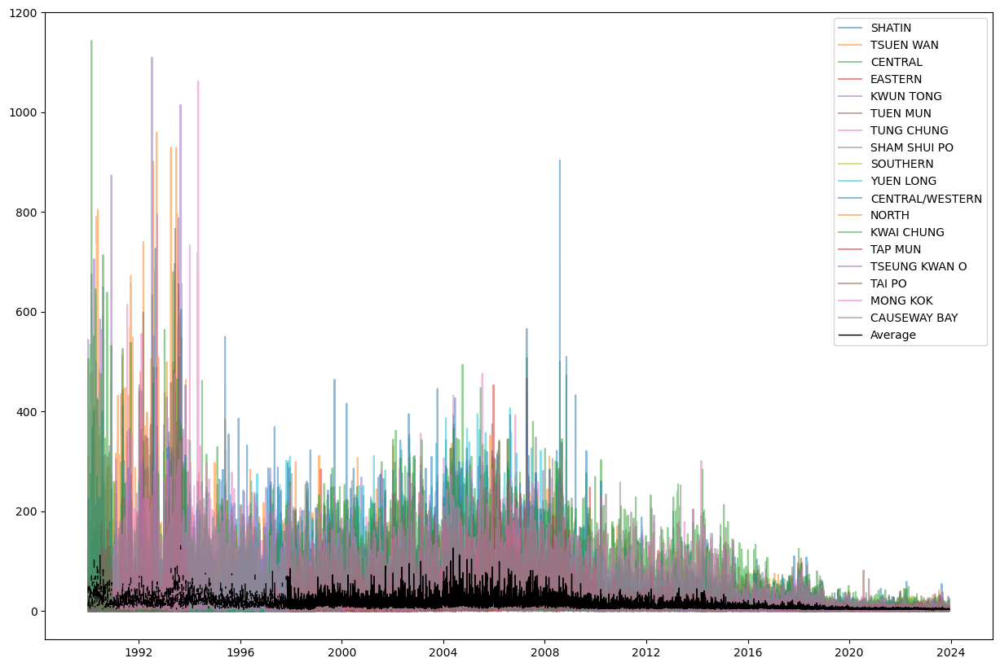

In [24]:
''' PLOTTING THE DATA OF SO2 AS A TEST '''
plt.figure(figsize=(15, 10))
for station in Stations:
    plt.plot(SO2['DATE'], SO2[station].astype(float), label=station, alpha=0.5)
plt.plot(SO2['DATE'], SO2['Average'].rolling(24).mean(), label='Average', color='black', linewidth=1)
plt.legend(loc='upper right')